<center> <img src=https://i.imgur.com/0TSSaqL.png width="550"> </center>
*
<center> <h3> Módulo 5 - Unidad 4: Supervisados I </h3> </center>
<center> <h4> Caso práctico </h4> </center>
*

## **1. Importa las librerías necesarias**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression



## **2. Cargar el dataset**

In [ ]:
onu=pd.read_csv("data_onu.csv")
print(onu.tail(10))
print(onu.shape)

         TCI     TCSC  exp  expmod        cm     cvbin  frqbin  abin     kurt  \
190   525.91   5.2000   30      30  0.049829  0.020580    0.50   979  26.5270   
191  1211.40   9.0000   60      45  0.069760  0.183620    0.75   758  13.7480   
192   494.46   8.8000   30      45  0.079726  0.184140    1.25   757  13.7310   
193   760.13   7.7333   60      45  0.059795  0.031007    0.75   968  19.2910   
194   481.83   7.8000   60      60  0.079726  0.027243    0.75   972  16.4820   
195   884.65  11.8000   60      45  0.119590  0.153430    1.50   811  12.2030   
196   607.91  11.4670   90      45  0.119590  0.137910    1.50   835  11.2310   
197   486.18  23.3330    0      60  0.069760  0.064303    0.75   931   9.0346   
198   391.76  10.5330   30      75  0.049829  0.025349    0.50   974  21.2550   
199   914.35  10.2000   60      45  0.119590  0.147110    1.50   821  13.5710   

      vfleak  ...       x1        x2    bCP       bWT      bW      Li  count1  \
190  0.84929  ...  0.44985 

In [ ]:
reto=pd.read_csv("data_reto.csv")
print(reto.tail(10))
print(reto.shape)

          TCI     TCSC  exp  expmod        cm     cvbin  frqbin  abin  \
9136  1006.70   9.4000    0      60  0.189350  0.239840    3.00   602   
9137   719.67  13.8000   60      60  0.119590  0.164900    1.75   792   
9138   566.72  13.8000   60      45  0.109620  0.170080    1.50   783   
9139  1042.50  10.5330   30      75  0.079726  0.031943    1.00   967   
9140   869.11  10.3330   30      30  0.079726  0.133850    0.75   841   
9141  1006.50  11.7330   60      45  0.099658  0.154050    1.50   810   
9142  1156.60   7.9333   60      45  0.109620  0.132480    1.50   843   
9143  1035.90  13.4000   60      60  0.099658  0.171770    1.75   780   
9144   842.18   9.4000   60      60  0.109620  0.119080    1.25   862   
9145   668.24   5.2667   30      60  0.059795  0.025349    0.50   974   

         kurt   vfleak  ...       x1        x2    bCP       bWT      bW  \
9136  19.2640  0.81794  ...  0.48280  0.006311  0.836  0.029191  3.6621   
9137   8.6834  0.80950  ...  0.35118  0.103670

In [ ]:
df=pd.DataFrame(pd.concat([onu,reto], axis=0))
df.shape
df.describe()

,TCI,TCSC,exp,expmod,cm,cvbin,frqbin,abin,kurt,vfleak,...,x1,x2,bCP,bWT,bW,Li,count1,count2,count3,VF
count,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,...,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000
mean,504.353963,26.299882,86.252407,145.697090,0.153621,0.182403,2.791355,727.611492,6.193315,0.709856,...,0.524101,0.064664,0.581789,0.234056,5.013366,25.919852,24.254654,74.592954,11.225070,0.169698
std,262.655961,20.261925,74.460439,66.014358,0.055652,0.063976,1.311452,126.386790,5.665358,0.167656,...,0.195112,0.066564,0.261608,0.183596,2.430607,19.462563,9.151386,14.033832,8.390583,0.375388
min,121.520000,2.266700,0.000000,15.000000,0.029897,0.015760,0.000000,500.000000,-1.618400,0.114860,...,0.103090,0.000227,0.030000,0.013999,0.244140,1.004900,9.500000,39.500000,1.999400,0.000000
25%,298.165000,10.533000,30.000000,90.000000,0.109620,0.152180,1.750000,624.000000,0.698087,0.663218,...,0.387412,0.010511,0.346000,0.096401,3.356900,9.054775,17.750000,64.250000,5.611475,0.000000
50%,435.690000,17.333000,75.000000,135.000000,0.149490,0.202680,2.500000,718.000000,6.121000,0.771765,...,0.499560,0.047750,0.662000,0.177640,5.249000,22.562000,22.500000,72.500000,8.787750,0.000000
75%,631.020000,42.400000,120.000000,195.000000,0.189350,0.234860,3.750000,813.000000,9.220850,0.825177,...,0.621230,0.088894,0.796000,0.325407,6.713900,38.808500,27.750000,83.500000,13.351500,0.000000
max,1861.200000,83.867000,450.000000,375.000000,0.358770,0.250250,8.750000,984.000000,57.369000,0.917030,...,0.993650,0.323140,0.948000,1.084600,11.536000,103.180000,83.000000,123.750000,78.707000,1.000000


El dataset consiste en un conjunto de 30 parámetros calculados a partir del Electrocardiograma (ECG). Estos parámetros, recogen distintas características del ECG, desde su comportamiento temporal como a amplitud, pendiente, etc. Hasta carácterísticas un poco más complejas como variables espectrales. A continuación, se muestra la lista completa de parámetros:

**Parámetros termporales** 

* TCI = threshold crossing interval 

* TCSC = threshold crossing sample count 

* Exp = exponencial estandard

* Expmod = exponencial modificada 

* MAV = valor medio absoluto

* count1 

* count2 

* count3

* x1

* x2

* bCP

**Parámetros espectrales** 

* vFleak = VF filter

* M

* A1

* A2

* A3

* x3

* x4

* x5

* bWT

**Parámetros de tipo tiempo-frecuencia**

* Li = basada en el análisis de ondas del ECG.

**Parámetros de complejidad del ECG** 

* CM = medida de la complejidad

* CVbin = covarianza

* abin = area

* Frqbin = frecuencia

* Kurt = Curtosis de una señal binaria extraída del ECG

* PSR = La reconstrucción del espacio de fase  

* HILB = La transformación de Hilbert

* SamEn = Muestra de entropía



### 2.3 Variable de salida

La variable que utilizaremos para clasificar los datos será **VF**. Donde:
- 0 nos indica que la persona está sana
- 1 nos indica que la persona tiene una Fibrilación Ventricular (VF). 





## **3. Analizar dataset:**
Para entender la distribución de los datos, vamos a observar:

- La cantidad de datos (count)
- La distribución de los datos mediante cuartiles (25%,50%,75%)
- Media de los datos (mean)
- Mínimos y máximos (min, max)
- Varianza (std)
- ...

In [ ]:
df.describe()

,TCI,TCSC,exp,expmod,cm,cvbin,frqbin,abin,kurt,vfleak,...,x1,x2,bCP,bWT,bW,Li,count1,count2,count3,VF
count,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,...,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000,9346.000000
mean,504.353963,26.299882,86.252407,145.697090,0.153621,0.182403,2.791355,727.611492,6.193315,0.709856,...,0.524101,0.064664,0.581789,0.234056,5.013366,25.919852,24.254654,74.592954,11.225070,0.169698
std,262.655961,20.261925,74.460439,66.014358,0.055652,0.063976,1.311452,126.386790,5.665358,0.167656,...,0.195112,0.066564,0.261608,0.183596,2.430607,19.462563,9.151386,14.033832,8.390583,0.375388
min,121.520000,2.266700,0.000000,15.000000,0.029897,0.015760,0.000000,500.000000,-1.618400,0.114860,...,0.103090,0.000227,0.030000,0.013999,0.244140,1.004900,9.500000,39.500000,1.999400,0.000000
25%,298.165000,10.533000,30.000000,90.000000,0.109620,0.152180,1.750000,624.000000,0.698087,0.663218,...,0.387412,0.010511,0.346000,0.096401,3.356900,9.054775,17.750000,64.250000,5.611475,0.000000
50%,435.690000,17.333000,75.000000,135.000000,0.149490,0.202680,2.500000,718.000000,6.121000,0.771765,...,0.499560,0.047750,0.662000,0.177640,5.249000,22.562000,22.500000,72.500000,8.787750,0.000000
75%,631.020000,42.400000,120.000000,195.000000,0.189350,0.234860,3.750000,813.000000,9.220850,0.825177,...,0.621230,0.088894,0.796000,0.325407,6.713900,38.808500,27.750000,83.500000,13.351500,0.000000
max,1861.200000,83.867000,450.000000,375.000000,0.358770,0.250250,8.750000,984.000000,57.369000,0.917030,...,0.993650,0.323140,0.948000,1.084600,11.536000,103.180000,83.000000,123.750000,78.707000,1.000000


In [ ]:
#Identificando Nulos
print(df.isnull().sum())
print("Hay duplicados: {}".format(df.duplicated().any()))

#analizando la variable target
print(print(df.VF.value_counts(normalize=True)))# son muy pocos los datos con ritmo afectado, esto puede afectar el modelo

TCI       0
TCSC      0
exp       0
expmod    0
cm        0
cvbin     0
frqbin    0
abin      0
kurt      0
vfleak    0
M         0
A1        0
A2        0
A3        0
mav       0
psr       0
hilb      0
SamEn     0
x3        0
x4        0
x5        0
x1        0
x2        0
bCP       0
bWT       0
bW        0
Li        0
count1    0
count2    0
count3    0
VF        0
dtype: int64
Hay duplicados: False
0    0.830302
1    0.169698
Name: VF, dtype: float64
None


In [ ]:
df.nunique()#solo VF es categorica

TCI       8254
TCSC      1130
exp         31
expmod      25
cm          34
cvbin      481
frqbin      34
abin       484
kurt      8997
vfleak    8181
M         8334
A1        8132
A2        8424
A3        8272
mav       8332
psr        133
hilb       150
SamEn     8202
x3        9108
x4          31
x5          72
x1        8699
x2        9031
bCP        457
bWT       8711
bW         181
Li        8870
count1     232
count2     297
count3    8585
VF           2
dtype: int64


TCI:

Cantidad de Ouliers:  286

TCSC:

Cantidad de Ouliers:  0

exp:

Cantidad de Ouliers:  247

expmod:

Cantidad de Ouliers:  8

cm:

Cantidad de Ouliers:  18

cvbin:

Cantidad de Ouliers:  45

frqbin:

Cantidad de Ouliers:  18

abin:

Cantidad de Ouliers:  0

kurt:

Cantidad de Ouliers:  113

vfleak:

Cantidad de Ouliers:  921

M:

Cantidad de Ouliers:  195

A1:

Cantidad de Ouliers:  279

A2:

Cantidad de Ouliers:  494

A3:

Cantidad de Ouliers:  0

mav:

Cantidad de Ouliers:  171

psr:

Cantidad de Ouliers:  0

hilb:

Cantidad de Ouliers:  0

SamEn:

Cantidad de Ouliers:  813

x3:

Cantidad de Ouliers:  1596

x4:

Cantidad de Ouliers:  1025

x5:

Cantidad de Ouliers:  379

x1:

Cantidad de Ouliers:  123

x2:

Cantidad de Ouliers:  483

bCP:

Cantidad de Ouliers:  0

bWT:

Cantidad de Ouliers:  247

bW:

Cantidad de Ouliers:  0

Li:

Cantidad de Ouliers:  27

count1:

Cantidad de Ouliers:  461

count2:

Cantidad de Ouliers:  38

count3:

Cantidad de Ouliers:  733

VF:

Cantidad d

'\ndf.drop(index_,inplace=True) \nsi se eliminan los outliers, solo quedarán 3759 registros, razón por la cual:\nSe implementarán dos copias del dataframe original, una para regresión logistica,otra para svm, ya que en cada uno se harán algunas acciones distintas:\n\na).Dataframe para regresión Logistica:\nDebido a que es susceptible a la presencia de outliers, se eliminarán todos, pero luego de eliminar features que tengan una alta correlación con otras.\n\nc).Dataframe para svm:\nDebido a que es robusto frente a outliers, solo se eliminarán los registros de los features que tengan mayor cantidad de valores atípicos y aquí no se eliminarán features con alta correlación entre ellos\na diferencia del anterior dataframe.\n'

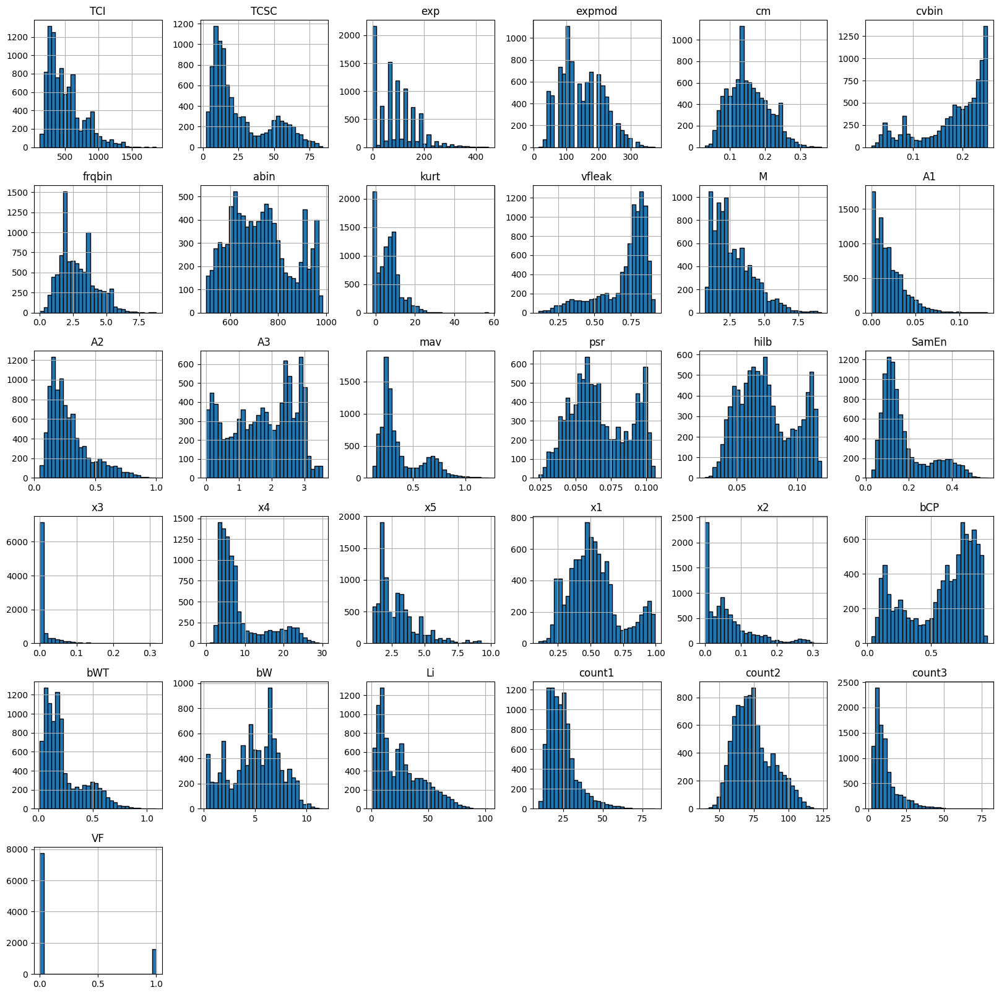

In [ ]:
df.hist(bins=30, figsize=(20,20), grid=True, edgecolor="black")
#se observan muchas variables sesgadas como TCI, TCSC, X3 entre otras muchas, y tambien se observa en varias features que la mediana y la media están alejadas, por ello analizaré la presencia de outliers, luego.
#También se aprecia que muchas features no poseen un  comportamiento normal como mav,samEn,psr, entre otras


#Analizando presencia de valores atípicos 
features=df.columns
def outliers_count(df,feature):

 def outliers_indexes(feature):
  Q1=np.percentile(feature,25)
  Q3=np.percentile(feature,75)
  IQR=Q3-Q1 #RANGO INTERCUARTIL
  whisker_width=1.5 
  threshold_low=Q1-(IQR*whisker_width)
  threshold_upper=(Q3+IQR*whisker_width)
  indexes=[index for index,value in feature.items() if ((value < threshold_low) or (value > threshold_upper))]
  return indexes
 indexes=outliers_indexes(df[feature])
 return len(indexes), indexes

index_=0
for f in features:
    print('\n' + f + ':\n')
    outliers_,index_=outliers_count(df,f)
    print("Cantidad de Ouliers: ", outliers_)#las variables con más outliers: x3,x4,SamEn

"""
df.drop(index_,inplace=True) 
si se eliminan los outliers, solo quedarán 3759 registros, razón por la cual:
Se implementarán dos copias del dataframe original, una para regresión logistica,otra para svm, ya que en cada uno se harán algunas acciones distintas:

a).Dataframe para regresión Logistica:
Debido a que es susceptible a la presencia de outliers, se eliminarán todos, pero luego de eliminar features que tengan una alta correlación con otras.

c).Dataframe para svm:
Debido a que es robusto frente a outliers, solo se eliminarán los registros de los features que tengan mayor cantidad de valores atípicos y aquí no se eliminarán features con alta correlación entre ellos
a diferencia del anterior dataframe.
"""

### 3.1 Análisis descriptivo

Representa visualmente los datos de manera que:
- Cada punto simbolice una persona
- Un punto es amarillo si la persona tiene Fibrilación Ventricular, y azul si no lo es
- Los ejes x e y representan dos variables que queramos comparar

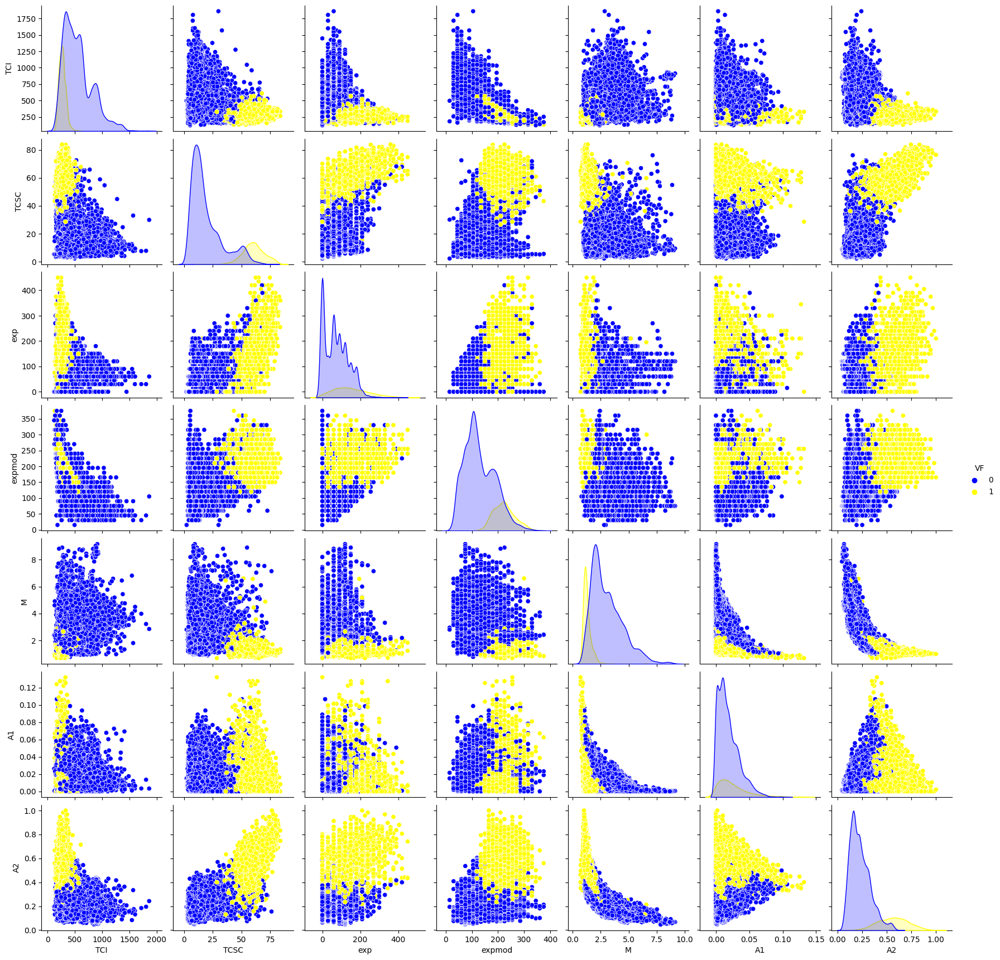

In [ ]:
sns.pairplot(df[['TCI', 'TCSC', 'exp', 'expmod',
       'M', 'A1', 'A2', 'VF']], hue="VF", palette=["blue","yellow"])

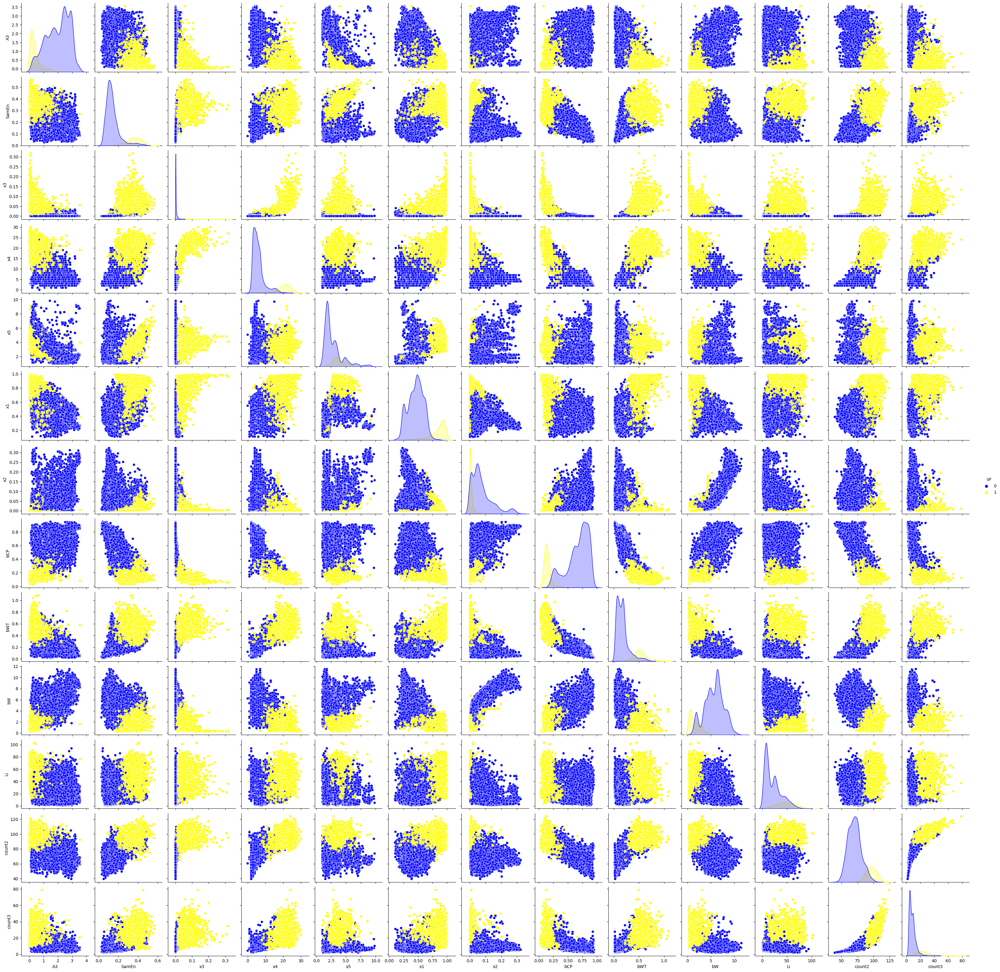

In [ ]:
sns.pairplot(df[['A3', 'SamEn', 'x3', 'x4', 'x5', 'x1', 'x2', 'bCP',
       'bWT', 'bW', 'Li', 'count2', 'count3', 'VF']], hue="VF", palette=["blue","yellow"])

In [ ]:
#funciones

# Curva ROC
from sklearn.metrics import roc_curve
from matplotlib import pyplot
from sklearn.metrics import roc_auc_score


def Roc(TRAIN_Y, TRAIN_X, MODEL_FITTED):
 sin_entrenar_probs = [0 for _ in range(len(TRAIN_Y))]
 predict_y=MODEL_FITTED.predict(TRAIN_X)
 predict_y_proba=MODEL_FITTED.predict_proba(TRAIN_X)

 fpr, tpr, _ = roc_curve(TRAIN_Y, predict_y_proba[:,1]);
 ns_fpr, ns_tpr, _ = roc_curve(TRAIN_Y, sin_entrenar_probs);

 # Graficar la curva ROC
 pyplot.plot(fpr, tpr, marker='.', label='Regresión Logística')
 pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='Sin entrenar')

 # Etiquetas de los ejes
 pyplot.xlabel('Tasa de Falsos Positivos')
 pyplot.ylabel('Tasa de Verdaderos Positivos')
 pyplot.legend()
 pyplot.show();
 
 # AUC
 print(roc_auc_score(TRAIN_Y, predict_y_proba[:,1]))


Preparando los datos

(9346, 25)

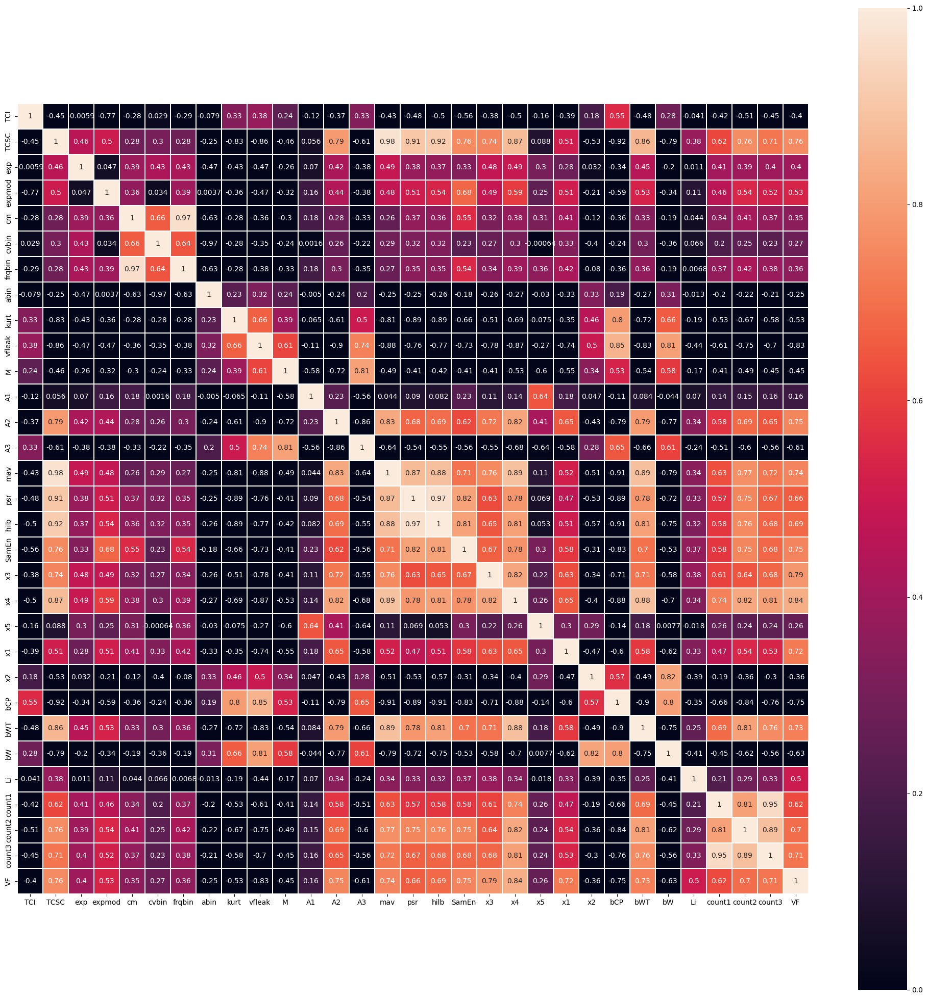

In [ ]:
############################################################## REGRESIÓN LOGISTICA###############################################################################
#Analizando correlaciones
plt.figure(figsize=(25,25))
c=sns.color_palette("rocket", as_cmap=True)
corr=df.corr()
sns.heatmap(corr,vmin=0,vmax=1, square=True, annot=True, cbar=True, linewidths=0.1,linecolor="white", cmap=c);

#variables altamente correlacionadas (MÁS DE 0.9 EN MAGNITUD):
"""
 features           features con la mayor correlación de la variable target
TCSC, PSR,hilb,x4 ->    TCSC
cm,frqbin ->         frqbin
count1,count3 ->     count3
abin,cvbin ->        cvbin
mav,bcp ->           bcp
"""
#eliminando las variables altamente correlacionadas

df_regresion=df.copy()
df_regresion.drop(["psr","hilb","count1","cm","abin","mav"],axis=1,inplace=True)
df_regresion.shape

In [ ]:
#Eliminando outliers
"""Se observo que al eliminar todos los outliers, los VF=1 se reducen a cero observaciones, razón por la cual no se eliminarán, sabiendo que esto afectará al modelo"""
print(df_regresion["VF"].value_counts(normalize=True))

0    0.830302
1    0.169698
Name: VF, dtype: float64


## **4. Entrenamiento de los modelos**

Crea un conjunto de datos de entrenamiento y un conjunto de datos de test.

Intrucciones: 

- seed: esta variable será igual la suma de las fechas de cumpleaños de los participantes. 

- test_size: no se permite usar más del 20% de datos para crear el test

In [ ]:
#Dividiendo el data set
df_regresion_x=df_regresion.copy()
print(df_regresion_x)


df_regresion_x=df_regresion_x.drop("VF",axis="columns")
df_regresion_y=df_regresion.loc[:,"VF"]
x_train,x_test,y_train,y_test=train_test_split(df_regresion_x,df_regresion_y,test_size=0.8,random_state=0)

#Estandarizando
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train=sc.fit_transform(x_train)
x_test=sc.transform(x_test)


          TCI     TCSC  exp  expmod     cvbin  frqbin       kurt   vfleak  \
0      438.42  46.8000  120     120  0.160160    1.75   0.153170  0.58320   
1      449.10  46.4670   60     120  0.157130    1.75  -0.053068  0.60206   
2      466.82  49.5330   90     135  0.164900    1.75  -0.159920  0.58141   
3      549.38  52.6000  120     120  0.171770    1.75  -0.399490  0.59277   
4      426.55  56.5330  135     105  0.181010    2.25  -0.430150  0.51779   
...       ...      ...  ...     ...       ...     ...        ...      ...   
9141  1006.50  11.7330   60      45  0.154050    1.50  11.265000  0.84687   
9142  1156.60   7.9333   60      45  0.132480    1.50  13.260000  0.81074   
9143  1035.90  13.4000   60      60  0.171770    1.75  10.576000  0.83354   
9144   842.18   9.4000   60      60  0.119080    1.25  12.775000  0.84912   
9145   668.24   5.2667   30      60  0.025349    0.50  24.945000  0.80487   

           M        A1  ...      x5       x1        x2    bCP       bWT  \


Crea el clasificador y entrénalo

In [ ]:
#inicializando el modelo con los parámetros
log_reg=LogisticRegression(random_state=1234)
# Ajustar el modelo a los datos
log_reg.fit(x_train,y_train)

# prediciendo
y_predict=log_reg.predict(x_test)
y_predict_train=log_reg.predict(x_train)



Predecir resultados y determinar acierto. ¡Consigue la mayor precisión posible!

In [ ]:
#Evaluando
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
accuracy_score_regresion=accuracy_score(y_test,y_predict, normalize=True)
accuracy_score_regresion_train=accuracy_score(y_train,y_predict_train, normalize=True)
classification_report_regresion=classification_report(y_test, y_predict)
classification_report_regresion_train=classification_report(y_train, y_predict_train)
confusion_matrix_regresion=confusion_matrix(y_test,y_predict)

#Estas métricas se compararán con los demás modelos
print("Precisión del modelo test:", accuracy_score_regresion) 
print("Precisión del modelo train:", accuracy_score_regresion_train)
print("Matriz de confusión del modelo:", confusion_matrix_regresion)
print("Reporte del modelo:",classification_report_regresion)


#Parece que no hay overfitting, puesto que la diferencia entre el acurracy de train y test es poca, así mismo los valores de las mátricas en el reporte del modelo

Precisión del modelo test: 0.985823191119433
Precisión del modelo train: 0.9903691813804173
Matriz de confusión del modelo: [[6169   58]
 [  48 1202]]
Reporte del modelo:               precision    recall  f1-score   support

           0       0.99      0.99      0.99      6227
           1       0.95      0.96      0.96      1250

    accuracy                           0.99      7477
   macro avg       0.97      0.98      0.97      7477
weighted avg       0.99      0.99      0.99      7477



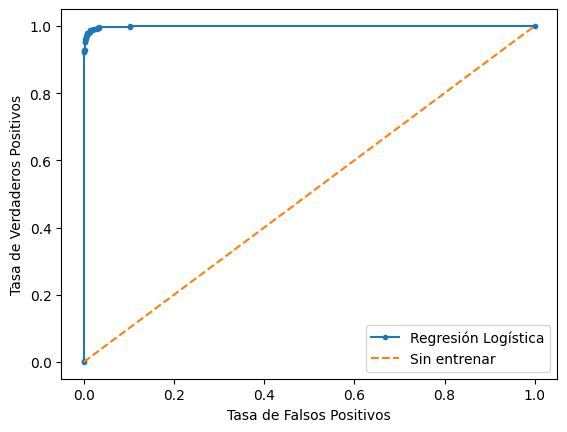

0.9991593669431242


In [ ]:
Roc(y_train, x_train, log_reg)

In [ ]:
############################################################ Regularización Ridge ##############################################################################################################
"""A diferencia de la regresión Logistica, aqui se usará la regularización para eliminar en lo posible la colinealidad entre las variables independientes, en vez de hacerlo manualmente"""
#Dividiendo el data set
df_ridge=df.copy()

df_ridge_x=df_ridge.copy()
df_ridge_x=df_ridge_x.drop("VF",axis="columns")

df_ridge_y=df_ridge.loc[:,"VF"]
x_train,x_test,y_train,y_test=train_test_split(df_ridge_x,df_ridge_y,test_size=0.8,random_state=1234)

#Estandarizando

from sklearn.preprocessing import StandardScaler
sc=StandardScaler().fit(x_train)
x_train=sc.transform(x_train)
x_test=sc.transform(x_test)


In [ ]:
#aplicando el modelo 
from sklearn.linear_model import RidgeClassifier
from sklearn.metrics import mean_squared_error
mse_ridge=0

ridge_model=RidgeClassifier(tol=0.01)
ridge_model.fit(x_train, y_train)

y_predict=ridge_model.predict(x_test)
y_predict_train=ridge_model.predict(x_train)
mse_ridge=(mean_squared_error(
y_true=y_test,
y_pred=y_predict,
squared=True
))

#obteniendo el lambda con el menor error medio
alpha=0
alpha=ridge_model.get_params()["alpha"]
print(f"El valor de alpha es: {alpha}")
print(f"Las predicciones del modelo final se alejan en promedio {round(mse_ridge,3)} unidades del valor real.")

#Evaluando

accuracy_score_ridge=accuracy_score(y_test,y_predict, normalize=True)
accuracy_score_ridge_train=accuracy_score(y_train,y_predict_train, normalize=True)
classification_report_ridge=classification_report(y_test, y_predict)
confusion_matrix_ridge=confusion_matrix(y_test, y_predict)

#Estas métricas se compararán con los demás modelos
print("Precisión del modelo test:", accuracy_score_ridge) 
print("Precisión del modelo train:", accuracy_score_ridge_train)
print("Matriz de confusión del modelo:", confusion_matrix_ridge)
print("Reporte del modelo:",classification_report_ridge)
print(mse_ridge)

El valor de alpha es: 1.0
Las predicciones del modelo final se alejan en promedio 0.016 unidades del valor real.
Precisión del modelo test: 0.9844857563193794
Precisión del modelo train: 0.9828785446762975
Matriz de confusión del modelo: [[6161   48]
 [  68 1200]]
Reporte del modelo:               precision    recall  f1-score   support

           0       0.99      0.99      0.99      6209
           1       0.96      0.95      0.95      1268

    accuracy                           0.98      7477
   macro avg       0.98      0.97      0.97      7477
weighted avg       0.98      0.98      0.98      7477

0.015514243680620569


In [ ]:
################################################## SVM ############################################################################
#Dividiendo el data set
df_svm=df.copy()

df_svm_x=df_svm.copy()
df_svm_x=df_svm_x.drop("VF",axis="columns")

df_svm_y=df_svm.loc[:,"VF"]
x_train,x_test,y_train,y_test=train_test_split(df_svm_x,df_svm_y,test_size=0.8,random_state=1234)

#Estandarizando

from sklearn.preprocessing import StandardScaler
sc=StandardScaler().fit(x_train)
x_train=sc.transform(x_train)
x_test=sc.transform(x_test)

#CASOS:

"""CASO 1 C=1, KERNEL=linear"""
#Lineal Kernel c=1
from sklearn import svm
svm_linear=svm.SVC(kernel="linear")
svm_linear.fit(x_train,y_train)

# Predecir para el dataset de Test
y_pred = svm_linear.predict(x_test)

#Evaluando

accuracy_score_svm=accuracy_score(y_test,y_predict, normalize=True)
classification_report_svm=classification_report(y_test, y_predict)
confusion_matrix_svm=confusion_matrix(y_test, y_predict)
print("Precisión del modelo:", accuracy_score_svm) 
print("Matriz de confusión del modelo:", confusion_matrix_svm)
print("Reporte del modelo:",classification_report_svm)

Precisión del modelo: 0.9844857563193794
Matriz de confusión del modelo: [[6161   48]
 [  68 1200]]
Reporte del modelo:               precision    recall  f1-score   support

           0       0.99      0.99      0.99      6209
           1       0.96      0.95      0.95      1268

    accuracy                           0.98      7477
   macro avg       0.98      0.97      0.97      7477
weighted avg       0.98      0.98      0.98      7477



## **5. Mejorar predicción**

¿Crees que puedes mejorar la predicción?

Puedes intentar:

- Optimizar los parámetros del clasificador
- Prueba entrenar otro tipo de clasificador

In [ ]:
"""CASO 2 C=0.95"""
#Lineal Kernel c=1
from sklearn import svm
svm_linear_2=svm.SVC(C=0.1, kernel="linear")
svm_linear_2.fit(x_train,y_train)

# Predecir para el dataset de Test
y_pred = svm_linear_2.predict(x_test)
y_pred_train = svm_linear_2.predict(x_train)
#Evaluando

accuracy_score_linear_2=accuracy_score(y_test,y_pred, normalize=True)
accuracy_score_linear_2_train=accuracy_score(y_train,y_pred_train, normalize=True)
classification_report_linear_2=classification_report(y_test, y_pred)
confusion_matrix_linear_2=confusion_matrix(y_test, y_pred)
print("Precisión del modelo test:", accuracy_score_linear_2) 
print("Precisión del modelo train:", accuracy_score_linear_2_train)
print("Matriz de confusión del modelo:", confusion_matrix_linear_2)
print("Reporte del modelo:",classification_report_linear_2)

Precisión del modelo test: 0.9866256519994651
Precisión del modelo train: 0.9925093632958801
Matriz de confusión del modelo: [[6172   37]
 [  63 1205]]
Reporte del modelo:               precision    recall  f1-score   support

           0       0.99      0.99      0.99      6209
           1       0.97      0.95      0.96      1268

    accuracy                           0.99      7477
   macro avg       0.98      0.97      0.98      7477
weighted avg       0.99      0.99      0.99      7477



In [ ]:
############################################################ BAYES NAIVE  #########################################################################################
#Dividiendo el data set
df_bayes=df.copy()

df_bayes_x=df_bayes.copy()
df_bayes_x=df_bayes_x.drop("VF",axis="columns")

df_bayes_y=df_bayes.loc[:,"VF"]
x_train,x_test,y_train,y_test=train_test_split(df_bayes_x,df_bayes_y,test_size=0.8,random_state=1234)

#Inicializando el modelo
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB(var_smoothing=1e-09)
#ajustando el modelo
nb.fit(x_train,y_train)
#predicción
y_pred=nb.predict(x_test)
y_pred_train=nb.predict(x_train)
# Evaluando
# ==============================================================================
accuracy_score_nb=accuracy_score(y_test,y_pred, normalize=True)
accuracy_score_nb_train=accuracy_score(y_train,y_pred_train, normalize=True)
classification_report_nb=classification_report(y_test, y_pred)
confusion_matrix_nb=confusion_matrix(y_test, y_pred)

print("Precisión del modelo test:", accuracy_score_nb) 
print("Precisión del modelo train:", accuracy_score_nb_train)
print("Matriz de confusión del modelo:", confusion_matrix_nb)
print("Reporte del modelo:",classification_report_nb)

Precisión del modelo test: 0.9509161428380366
Precisión del modelo train: 0.9561262707330123
Matriz de confusión del modelo: [[5872  337]
 [  30 1238]]
Reporte del modelo:               precision    recall  f1-score   support

           0       0.99      0.95      0.97      6209
           1       0.79      0.98      0.87      1268

    accuracy                           0.95      7477
   macro avg       0.89      0.96      0.92      7477
weighted avg       0.96      0.95      0.95      7477



##**EVALUACIÓN:**
Cuando termines el reto, calcula los siguientes valores para el modelo que mejor predicción obtuviste:
- BER

In [ ]:
### NO MODIFICAR

def eval_predict(model_name, X_train):
  import sklearn.metrics as metrics
  data_onu = df.copy()

  # list of features
  features = X_train.columns 

  X_onu = data_onu.drop('VF',axis=1)
  y_onu = data_onu['VF']

  y_pred_onu = model_name.predict(X_onu[features])

  BER = 1 - metrics.balanced_accuracy_score(y_onu, y_pred_onu)
  variables = len(features)
  print(BER*100)

  return BER

In [ ]:
#ejemplo:
# Cambia model_name por el nombre del modelo que mejor resultado obtuviste

eval_predict(svm_linear_2, x_train)


20.06518050987377


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


0.2006518050987377